In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import matplotlib
import folium

In [2]:
mpv = pd.read_csv("https://raw.githubusercontent.com/zayn-hash/CrimeRatesproject/main/Mapping%20Police%20Violence.csv")


In [3]:
mpv.drop([ 'officer_races', 'zip', 'pop_total_census_tract', 'officer_names','ori', 'officer_charged', 'news_urls', 'victim_image', 'street_address','pop_white_census_tract','pop_black_census_tract','pop_native_american_census_tract', 'pop_asian_census_tract', 'pop_pacific_islander_census_tract', 'congressperson_party', 'prosecutor_head', 'prosecutor_race', 'prosecutor_gender', 'prosecutor_party', 'wapo_armed', 'wapo_body_camera', 'encounter_type', 'officer_races', 'officer_known_past_shootings', "call_for_service", 'tract', 'urban_rural_uspsai', 'urban_rural_nchs', 'hhincome_median_census_tract', 'wapo_id', 'off_duty_killing', 'geography', 'mpv_id', 'fe_id', 'pop_other_multiple_census_tract', 'pop_hispanic_census_tract','congressional_district_113','congressperson_lastname','congressperson_firstname', 'prosecutor_term', 'prosecutor_in_court', 'prosecutor_special', 'independent_investigation', 'prosecutor_url'],inplace=True, axis=1)
mpv

,name,age,gender,race,date,city,state,county,agency_responsible,cause_of_death,circumstances,disposition_official,signs_of_mental_illness,allegedly_armed,wapo_threat_level,wapo_flee,initial_reason,latitude,longitude
0,Sean M. Burke,34.0,Male,Unknown race,2/7/2023,Anchorage,AK,Anchorage Municipality,Anchorage Police Department,Gunshot,Police were investigating a call for shots fir...,Pending Investigation,No,Allegedly Armed,Brandished Weapon,Not Fleeing,Shots fired,61.420000,-149.500000
1,Jawan Dallas,36.0,Male,Black,2/7/2023,Theodore,AL,Mobile,Mobile Police Department,Taser,Police were called for a burglary. Officers cl...,"Pending Investigation,Pending Federal Investig...",Drug or Alcohol Use,Unarmed/Did Not Have Actual Weapon,Sudden Threatening Movement,Foot,burglary,30.576870,-88.182223
2,Sam Knight,40.0,Male,Unknown race,2/7/2023,Bloomingdale,GA,Effingham,Effingham County Sheriff's Office,Gunshot,Deputies attempted traffic stop on victim. Pol...,Pending Investigation,No,Allegedly Armed,Attack,Car,Traffic Stop,32.127835,-81.387554
3,Raul Mendez,35.0,Male,Hispanic,1/7/2023,Phoenix,AZ,Maricopa,Phoenix Police Department,Gunshot,Police responding to a burglary believed victi...,Pending Investigation,NaN,Unarmed/Did Not Have Actual Weapon,Other,Not Fleeing,burglary in progress,33.448268,-112.016226
4,Wendell Dalton,58.0,Male,White,1/7/2023,Harts,WV,Lincoln,Lincoln County Sheriff's Office,Gunshot,Police responded to a report of a domestic dis...,Pending Investigation,No,Allegedly Armed,Brandished Weapon,Not Fleeing,Shots fired,38.000000,-82.220000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11828,Andrew L. Closson,21.0,Male,White,1/1/2013,Gordon,WI,Douglas,Douglas County Sheriff's Office,Gunshot,Deputies responded to a 911 call of shots fire...,Justified,Drug or Alcohol Use,Allegedly Armed,Brandished Weapon,Foot,shots fired,46.245268,-91.801031
11829,Abel Gurrola,26.0,Male,Hispanic,1/1/2013,Bakersfield,CA,Kern,Bakersfield Police Department,Gunshot,Officers responded to reports of gunshots at a...,Justified,No,Allegedly Armed,NaN,NaN,shots fired,35.350508,-119.011261
11830,Andrew Layton,26.0,Male,White,1/1/2013,Mankato,MN,Blue Earth,Mankato Department of Public Safety,Taser,Former combat medic Layton was found unconscio...,Unreported,No,Unarmed/Did Not Have Actual Weapon,NaN,NaN,unconscious person,44.164679,-94.007459
11831,Christopher Calhoun,38.0,Male,Unknown race,29/6/2012,Atlanta,GA,Fulton,Atlanta Police Department,Gunshot,Calhoun was wanted on multiple vehicle theft a...,Unknown,No,Unclear,NaN,NaN,NaN,33.740618,-84.414067




```
# This is formatted as code
```

# cloumns are dropped due to null values
mpv.drop([ 'officer_races', 'zip', 'pop_total_census_tract', 'officer_names','ori', 'officer_charged', 'news_urls', 'victim_image', 'street_address','pop_white_census_tract','pop_black_census_tract','pop_native_american_census_tract', 'pop_asian_census_tract',	'pop_pacific_islander_census_tract',	'congressperson_party',	'prosecutor_head', 'prosecutor_race', 'prosecutor_gender', 'prosecutor_party', 'allegedly_armed',	'wapo_armed', 'wapo_threat_level',	'wapo_flee',	'wapo_body_camera',	'encounter_type',	'initial_reason',	'latitude',	'longitude', 'officer_races',	'officer_known_past_shootings',	"call_for_service",	'tract', 'urban_rural_uspsai',	'urban_rural_nchs',	'hhincome_median_census_tract', 'wapo_id',	'off_duty_killing',	'geography',	'mpv_id',	'fe_id', 'pop_other_multiple_census_tract', 'pop_hispanic_census_tract','congressional_district_113','congressperson_lastname','congressperson_firstname', 'prosecutor_term',	'prosecutor_in_court',	'prosecutor_special',	'independent_investigation', 'prosecutor_url']

```
[# This is formatted as code](https://)
```

)


In [4]:
print(mpv.shape)

mpv.dropna(subset = ['race', 'gender', 'signs_of_mental_illness', 'cause_of_death'], inplace=True)
mpv.isna().sum()


(11833, 19)


name                          0
age                         408
gender                        0
race                          0
date                          0
city                         10
state                         0
county                        7
agency_responsible            7
cause_of_death                0
circumstances                18
disposition_official         54
signs_of_mental_illness       0
allegedly_armed              12
wapo_threat_level           892
wapo_flee                  1996
initial_reason              805
latitude                      0
longitude                     0
dtype: int64

In [5]:
mpv.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11304 entries, 0 to 11832
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   name                     11304 non-null  object 
 1   age                      10896 non-null  float64
 2   gender                   11304 non-null  object 
 3   race                     11304 non-null  object 
 4   date                     11304 non-null  object 
 5   city                     11294 non-null  object 
 6   state                    11304 non-null  object 
 7   county                   11297 non-null  object 
 8   agency_responsible       11297 non-null  object 
 9   cause_of_death           11304 non-null  object 
 10  circumstances            11286 non-null  object 
 11  disposition_official     11250 non-null  object 
 12  signs_of_mental_illness  11304 non-null  object 
 13  allegedly_armed          11292 non-null  object 
 14  wapo_threat_level     

In [6]:
x = mpv["cause_of_death"].value_counts()
mpv["cause_of_death"] = mpv["cause_of_death"].str.replace('Beaten', 'Beaten', case=False)
mpv
x


Gunshot                                           10362
Gunshot,Taser                                       298
Taser                                               295
Vehicle                                             156
Physical Restraint                                   57
Beaten                                               30
Other                                                13
Taser,Physical Restraint                             13
Asphyxiated                                           8
Unclear                                               6
blunt force trauma/car crash                          5
Pepper Spray                                          4
Taser,Pepper Spray                                    4
Vehicle,Other                                         3
Gunshot,Vehicle                                       3
Taser,Beaten                                          3
Bean bag                                              2
Other,Vehicle                                   

In [7]:
mpv.shape

(11304, 19)

In [8]:
# mpv["disposition_official"].str.contains("Charged").isnull().sum()




In [9]:
mpv2 = mpv.copy(deep=True)
mpv2 = mpv2[mpv2["disposition_official"].str.contains("Charged").fillna(False)]
mpv2


,name,age,gender,race,date,city,state,county,agency_responsible,cause_of_death,circumstances,disposition_official,signs_of_mental_illness,allegedly_armed,wapo_threat_level,wapo_flee,initial_reason,latitude,longitude
33,Melissa Perez,46.0,Female,Hispanic,23/6/2023,San Antonio,TX,Bexar,San Antonio Police Department,Gunshot,Police responded to a report of a woman cuttin...,"Charged with murder,Federal Civil Rights Inves...",Yes,Allegedly Armed,Brandished Weapon,Not Fleeing,destruction of property,29.340876,-98.619509
194,Juston Michael Reffel,38.0,Male,White,3/5/2023,La Salle,CO,Weld,La Salle Police Department,Gunshot,Officers respond to a report of a suspicious v...,Charged with second-degree murder,Unknown,Unarmed/Did Not Have Actual Weapon,Undetermined,Foot,Suspicious Vehicle,40.349137,-104.705266
300,James Corey Donald,45.0,Male,White,2/4/2023,Laurel,MS,Jones,Jones County Sheriff's Office,Gunshot,The victim was being escorted out of the churc...,"Pending Investigation,Charged with 2nd degree ...",No,Unarmed/Did Not Have Actual Weapon,None,Not Fleeing,Disturbance,31.677472,-89.110296
387,Elias Hans Anderson,44.0,Male,White,4/3/2023,Aurora,CO,Arapahoe,Aurora CO Police Department,Vehicle,Victim was driving his vehicle through an inte...,"charged with vehicular homicide,Charged with c...",No,Unarmed/Did Not Have Actual Weapon,None,Not Fleeing,Accident,39.663618,-104.809951
395,Brian Anthony Finch,65.0,Male,White,3/3/2023,Spring Lake,NC,Harnett,Harnett County Sheriff's Office,Vehicle,The victim was a passenger in a vehicle that w...,Charged with manslaughter,No,Unarmed/Did Not Have Actual Weapon,None,Not Fleeing,Accident,35.225908,-78.940411
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11477,Jordan Burnell West-Morson,26.0,Male,Black,1/5/2013,Detroit,MI,Wayne,Detroit Transportation Corporation,Gunshot,A scuffle apparently broke out at a gas statio...,"""Charged with homicide and felony firearm char...",No,Unclear,NaN,Not Fleeing,physical altercation,42.449836,-82.967937
11520,Fred Bradford Jr.,51.0,Male,Black,21/4/2013,Dallas,TX,Dallas,Dallas Police Department,Vehicle,Burgess and partner Michael Puckett said they ...,"""Charged with criminally negligent homicide, A...",No,Unarmed/Did Not Have Actual Weapon,None,bicycle,suspicious behavior,32.762002,-96.774524
11530,Julie Serna Gonzales,42.0,Female,Hispanic,19/4/2013,Stafford,VA,Stafford,U.S. Federal Bureau of Investigation,Gunshot,An FBI instructor called police and reportedly...,"""Charged, Acquitted""",No,Allegedly Armed,Used Weapon,Not Fleeing,Shooting,38.491699,-77.545925
11631,Willie Lee Bingham Jr.,20.0,Male,Black,13/3/2013,Cleveland,MS,Bolivar,Bolivar County Sheriff's Office,Gunshot,20-year-old Willie Lee Bingham Jr. was shot an...,Charged with manslaughter,No,Unarmed/Did Not Have Actual Weapon,NaN,Foot,Vandalism,33.727806,-90.719626


In [10]:
mpv.columns



table_2 = mpv.groupby(["race","signs_of_mental_illness", (mpv['cause_of_death']=='Gunshot')]).size().reset_index().rename(columns={0:'police_crimes'})

table_1 = mpv.pivot_table(index=["race","signs_of_mental_illness"], values = "name" , aggfunc = "count", columns= "cause_of_death",fill_value=0)[["Gunshot,Taser","Gunshot","Taser","Vehicle"]]
print(table_1.columns)
table_1
table_2

Index(['Gunshot,Taser', 'Gunshot', 'Taser', 'Vehicle'], dtype='object', name='cause_of_death')


,race,signs_of_mental_illness,cause_of_death,police_crimes
0,Asian,Drug or Alcohol Use,False,1
1,Asian,Drug or Alcohol Use,True,7
2,Asian,No,False,7
3,Asian,No,True,80
4,Asian,Unknown,False,1
5,Asian,Unknown,True,32
6,Asian,Yes,False,6
7,Asian,Yes,True,32
8,Black,Drug or Alcohol Use,False,34
9,Black,Drug or Alcohol Use,True,57


<Axes: xlabel='signs_of_mental_illness', ylabel='police_crimes'>

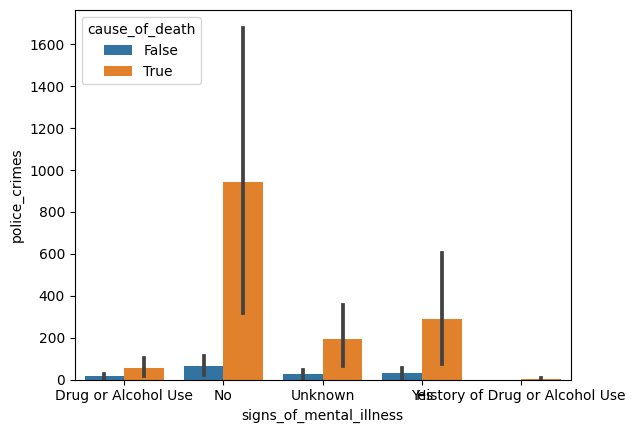

In [11]:
sns.barplot(data=table_2, x="signs_of_mental_illness", y="police_crimes",hue="cause_of_death")

([<matplotlib.patches.Wedge at 0x7f2a008a39d0>,
 [Text(0.9770510171922069, 0.5053427646693618, 'Los Angeles '),
  Text(0.16241124827027612, 1.0879442018942382, 'Phoenix'),
  Text(-0.7747782653129995, 0.7808448242759759, 'Houston'),
  Text(-1.099866174451881, 0.01715803883270592, 'Chicago'),
  Text(-0.9123463061021292, -0.6145113650224867, 'San Antonio'),
  Text(-0.44814177273332645, -1.004574014959292, 'Las Vegas'),
  Text(0.08741676450639758, -1.096521002663986, 'Albuquerque '),
  Text(0.5549457613246631, -0.9497553379622513, 'Jacksonville'),
  Text(0.8947347507104985, -0.6398825875666739, 'Columbus'),
  Text(1.0767642501397927, -0.22489719789470453, 'Tucson ')],
 [Text(0.5329369184684765, 0.27564150800147, '15.19%'),
  Text(0.08858795360196879, 0.5934241101241299, '14.90%'),
  Text(-0.4226063265343633, 0.4259153586959868, '14.70%'),
  Text(-0.5999270042464805, 0.009358930272385046, '9.93%'),
  Text(-0.4976434396920704, -0.33518801728499276, '9.43%'),
  Text(-0.24444096694545075, -0.5

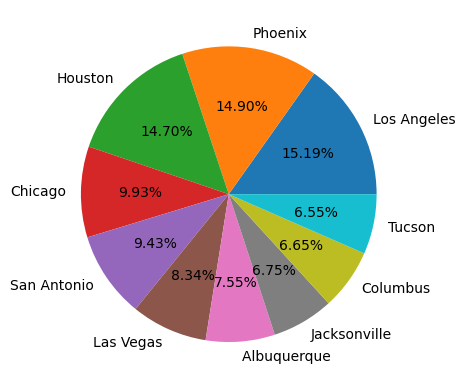

In [12]:
city_names = mpv.city.value_counts().index
city_crimes = mpv.city.value_counts().values

plt.pie(city_crimes[:10], labels = city_names[:10], autopct = '%1.2f%%')

Above graph shows the top 10 cities in USA according to Police Killings.

([<matplotlib.patches.Wedge at 0x7f2a00eaab30>,
 [Text(0.5760808755782517, 0.9370863486322886, 'CA'),
  Text(-0.9851781029471786, 0.48930982564567255, 'TX'),
  Text(-0.8639959406691551, -0.680816432312868, 'FL'),
  Text(-0.12142396918661097, -1.0932777413388461, 'AZ'),
  Text(0.49052684554314757, -0.9845727062038075, 'GA'),
  Text(0.8934213796416947, -0.6417150757143945, 'CO'),
  Text(1.0776195390118457, -0.22076260811083262, 'NC')],
 [Text(0.31422593213359185, 0.5111380083448847, '32.45%'),
  Text(-0.5373698743348246, 0.26689626853400317, '20.42%'),
  Text(-0.47127051309226636, -0.3713544176252007, '15.50%'),
  Text(-0.06623125591996962, -0.5963333134575524, '9.74%'),
  Text(0.2675600975689896, -0.5370396579293495, '8.50%'),
  Text(0.4873207525318334, -0.3500264049351242, '6.96%'),
  Text(0.5877924758246431, -0.12041596806045414, '6.43%')])

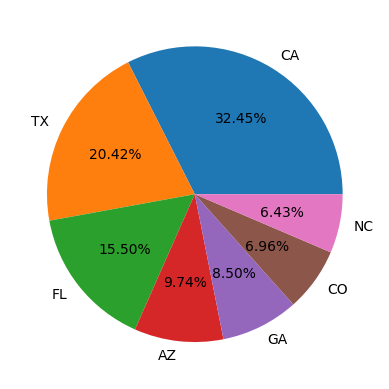

In [13]:
state_names = mpv.state.value_counts().index
state_crimes = mpv.state.value_counts().values

plt.pie(state_crimes[:7], labels = state_names[:7], autopct = '%1.2f%%')

::Above graph shows the top 7 States in USA according to Police Killings.

In [14]:
crimes_vs_races = mpv.groupby(['race', 'cause_of_death', 'gender']).size().reset_index().rename(columns={0:'crimes_count'})
crimes_vs_races.head()

,race,cause_of_death,gender,crimes_count
0,Asian,Beaten,Male,1
1,Asian,Gunshot,Female,11
2,Asian,Gunshot,Male,139
3,Asian,Gunshot,Unknown,1
4,Asian,"Gunshot,Taser",Female,1


<Axes: xlabel='race', ylabel='crimes_count'>

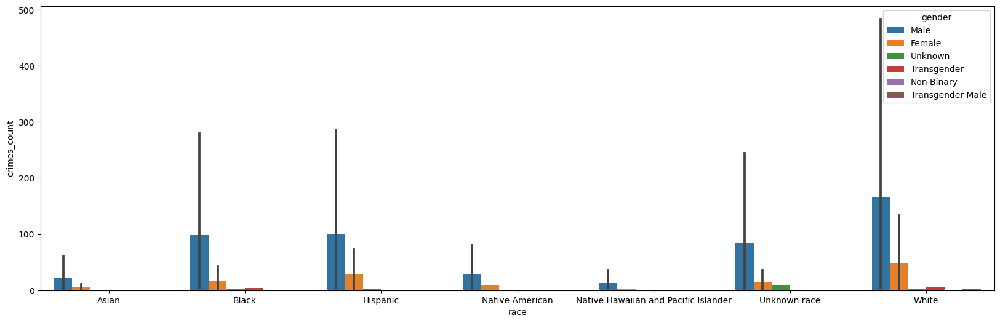

In [15]:
matplotlib.rcParams['figure.figsize'] = (20,6)
sns.barplot(x="race", y='crimes_count', hue='gender',data=crimes_vs_races )

<Axes: xlabel='race', ylabel='count'>

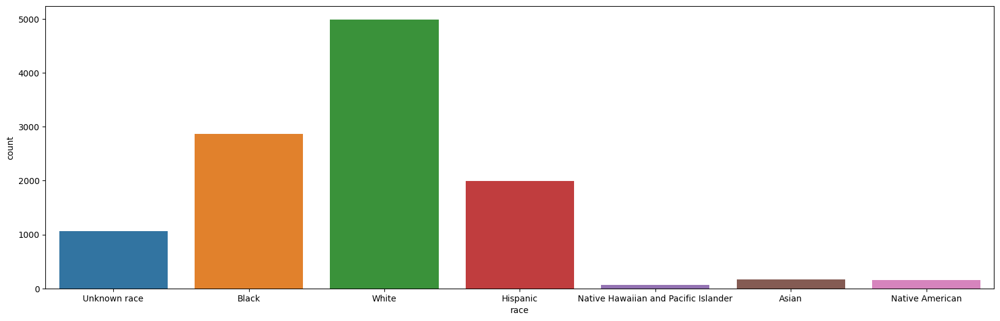

In [16]:
sns.countplot(x='race',data = mpv)

<Axes: xlabel='state', ylabel='no_of_gunshots'>

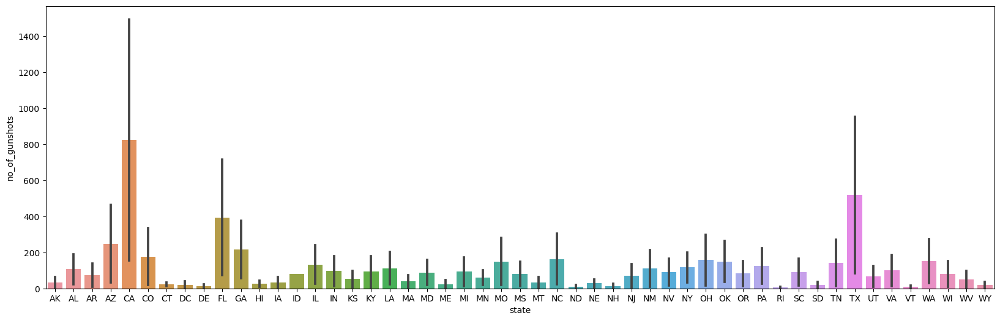

In [17]:
# Gunshot_cases = mpv[mpv['cause_of_death']=='Gunshot'].groupby('state').size().reset_index().rename(columns={0:'no_of_gunshots'})

Gunshot_cases = mpv.groupby(['state',mpv['cause_of_death']=='Gunshot']).size().reset_index().rename(columns={0:'no_of_gunshots'})
# Gunshot_cases = mpv.groupby(['state','cause_of_death']).size().reset_index().rename(columns={0:'no_of_gunshots'})

sns.barplot(x='state', y='no_of_gunshots',data=Gunshot_cases)


In [18]:
# this_map = folium.Map(prefer_canvas=True)
this_map = folium.Map(location=[37.0902, -95.7129])
def plotDot(point):
  folium.CircleMarker(location=[point.latitude, point.longitude],
                      radius=1,
                      weight=3).add_to(this_map)

mpv.apply(plotDot, axis=1)
this_map.fit_bounds(this_map.get_bounds())
this_map

#Only Policeman who face charged

<ipython-input-19-483742c02ab9>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  asd = mpv.corr()


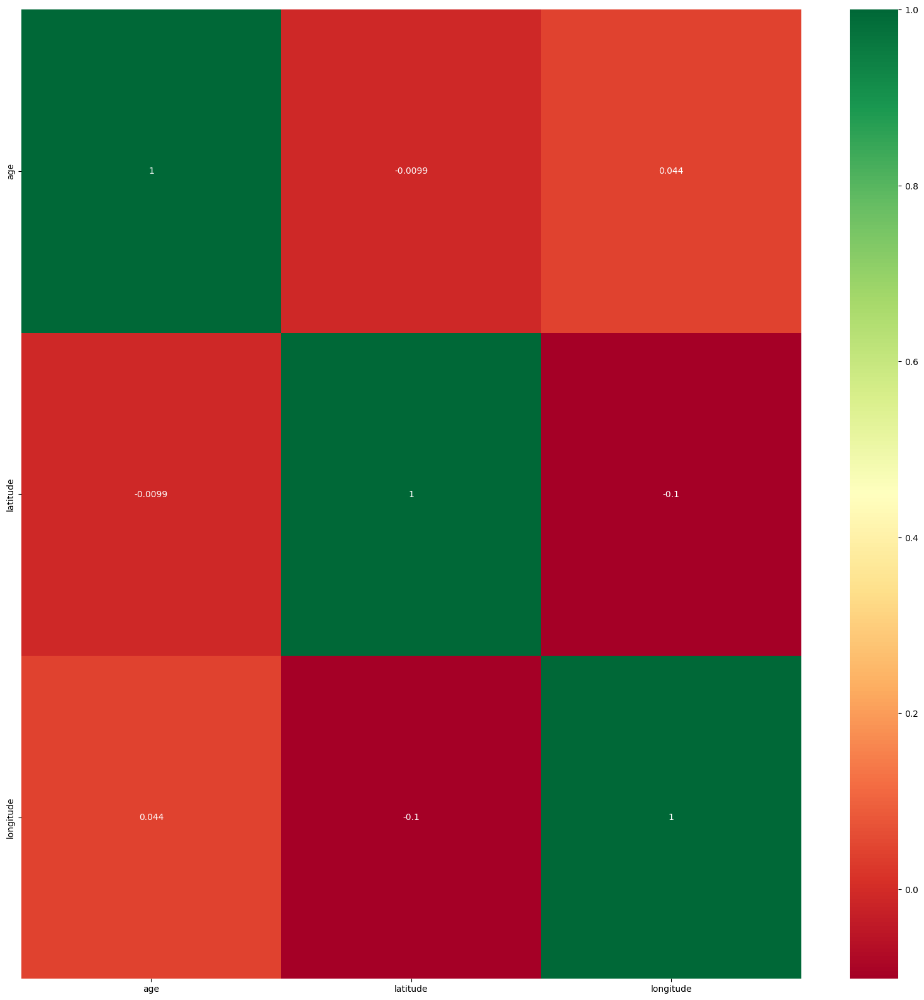

In [19]:
asd = mpv.corr()
top = asd.index
plt.figure(figsize=(20,20))
g=sns.heatmap(mpv[top].corr(),annot=True,cmap= "RdYlGn")

In [20]:
mpv2 = mpv.copy(deep=True)
mpv2 = mpv2[mpv2["disposition_official"].str.contains("Charged").fillna(False)]
mpv2.head()


,name,age,gender,race,date,city,state,county,agency_responsible,cause_of_death,circumstances,disposition_official,signs_of_mental_illness,allegedly_armed,wapo_threat_level,wapo_flee,initial_reason,latitude,longitude
33,Melissa Perez,46.0,Female,Hispanic,23/6/2023,San Antonio,TX,Bexar,San Antonio Police Department,Gunshot,Police responded to a report of a woman cuttin...,"Charged with murder,Federal Civil Rights Inves...",Yes,Allegedly Armed,Brandished Weapon,Not Fleeing,destruction of property,29.340876,-98.619509
194,Juston Michael Reffel,38.0,Male,White,3/5/2023,La Salle,CO,Weld,La Salle Police Department,Gunshot,Officers respond to a report of a suspicious v...,Charged with second-degree murder,Unknown,Unarmed/Did Not Have Actual Weapon,Undetermined,Foot,Suspicious Vehicle,40.349137,-104.705266
300,James Corey Donald,45.0,Male,White,2/4/2023,Laurel,MS,Jones,Jones County Sheriff's Office,Gunshot,The victim was being escorted out of the churc...,"Pending Investigation,Charged with 2nd degree ...",No,Unarmed/Did Not Have Actual Weapon,None,Not Fleeing,Disturbance,31.677472,-89.110296
387,Elias Hans Anderson,44.0,Male,White,4/3/2023,Aurora,CO,Arapahoe,Aurora CO Police Department,Vehicle,Victim was driving his vehicle through an inte...,"charged with vehicular homicide,Charged with c...",No,Unarmed/Did Not Have Actual Weapon,None,Not Fleeing,Accident,39.663618,-104.809951
395,Brian Anthony Finch,65.0,Male,White,3/3/2023,Spring Lake,NC,Harnett,Harnett County Sheriff's Office,Vehicle,The victim was a passenger in a vehicle that w...,Charged with manslaughter,No,Unarmed/Did Not Have Actual Weapon,None,Not Fleeing,Accident,35.225908,-78.940411


<Axes: xlabel='state', ylabel='name'>

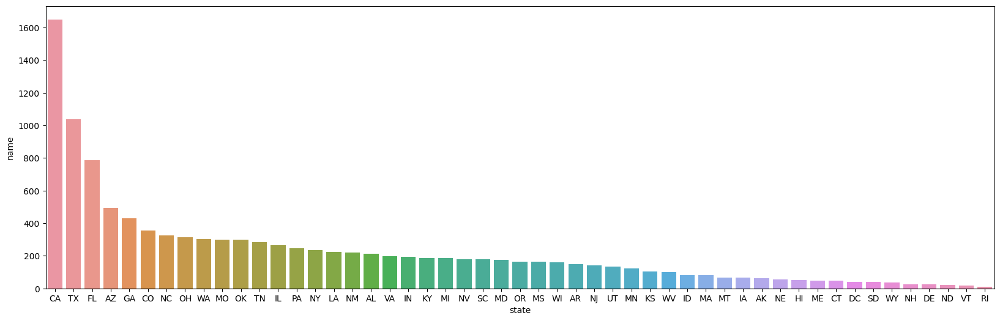

In [21]:
# matplotlib.rcParams['figure.figsize'] = (20,6)
charged = mpv.groupby("state").agg({"name":"count"}).reset_index().sort_values("name", ascending = False)
# .rename(columns={0:'no_of_gunshots'})
# Charged
sns.barplot(x="state", y='name', data=charged )

<Axes: xlabel='race', ylabel='count'>

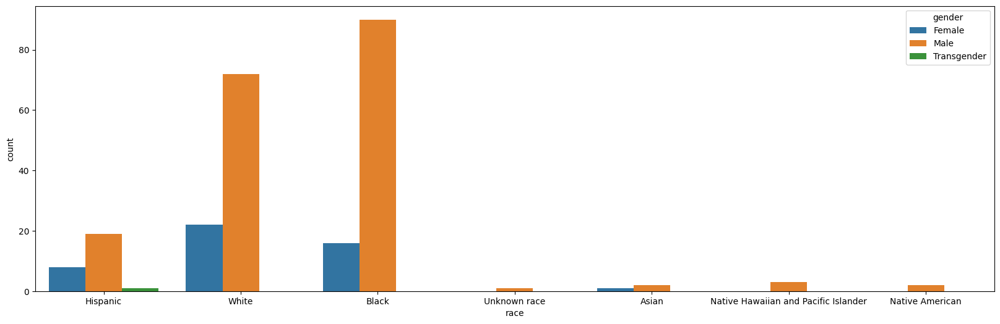

In [22]:
# charged2 =
# mpv.groupby(["race"]).agg({"gender":"count"}).reset_index().sort_values("gender", ascending = False)
# sns.barplot(x="race", y='gender', data=charged2 )


# mpv2

sns.countplot(data=mpv2, x="race", hue="gender")

In [23]:
mpv.columns

Index(['name', 'age', 'gender', 'race', 'date', 'city', 'state', 'county',
       'agency_responsible', 'cause_of_death', 'circumstances',
       'disposition_official', 'signs_of_mental_illness', 'allegedly_armed',
       'wapo_threat_level', 'wapo_flee', 'initial_reason', 'latitude',
       'longitude'],
      dtype='object')

In [24]:
mpv['signs_of_mental_illness'].unique()

array(['No', 'Drug or Alcohol Use', 'Yes', 'Unknown',
       'History of Drug or Alcohol Use'], dtype=object)

In [25]:
mpv['signs_of_mental_illness'].isna().sum()

0

In [26]:
mpv['signs_of_mental_illness'].value_counts()

No                                7031
Yes                               2215
Unknown                           1547
Drug or Alcohol Use                502
History of Drug or Alcohol Use       9
Name: signs_of_mental_illness, dtype: int64

In [27]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB

from sklearn.preprocessing import LabelEncoder

In [28]:
# Sample DataFrame
data = {'signs_of_mental_illness': ['No', 'Yes', 'Drug or Alcohol Use', 'History of Drug or Alcohol Use', 'Unknown']}
df = pd.DataFrame(data)

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit the encoder on the categorical column and transform the values
df['s_o_mi'] = label_encoder.fit_transform(df['signs_of_mental_illness'])

print(df)

          signs_of_mental_illness  s_o_mi
0                              No       2
1                             Yes       4
2             Drug or Alcohol Use       0
3  History of Drug or Alcohol Use       1
4                         Unknown       3


In [29]:
df_ohencod = mpv.copy(deep = True)
df_ohencod = df_ohencod.drop(['name', 'age', 'gender', 'date', 'circumstances', 'latitude','longitude','agency_responsible', 'state', 'city', 'county'], axis = 1)


#performig one-hot encoding
encoded_df = pd.get_dummies(df_ohencod, columns = ['allegedly_armed', 'race', 'cause_of_death','wapo_threat_level', 'wapo_flee', 'initial_reason', 'disposition_official' ])

encoded_df.drop('signs_of_mental_illness',axis=1, inplace=True)
encoded_df

,allegedly_armed_Allegedly Armed,allegedly_armed_Unarmed/Did Not Have Actual Weapon,allegedly_armed_Unclear,allegedly_armed_Vehicle,race_Asian,race_Black,race_Hispanic,race_Native American,race_Native Hawaiian and Pacific Islander,race_Unknown race,...,disposition_official_cleared by US Attorney,"disposition_official_cleared by US Attorney,Civil Suit",disposition_official_cleared by appeals court,"disposition_official_cleared by appeals court,civil suit/lost",disposition_official_cleared by coroner's jury,disposition_official_cleared by state attorney,"disposition_official_cleared by state attorney,Civil suit/Pending",disposition_official_convicted of criminally negligent homicide,disposition_official_justified by appeals court,disposition_official_reopen investigation by DA
0,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11828,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11829,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11830,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11831,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [30]:
# Assuming you have predictions or results in the Encoded_Category column
# Create a mapping DataFrame to map Encoded_Category back to Category
mapping_df = df[['signs_of_mental_illness', 's_o_mi']].drop_duplicates()

# Merge the mapping DataFrame with your predictions/results DataFrame
results_df = mpv.merge(mapping_df, on='signs_of_mental_illness', how='left')






In [31]:
X = encoded_df  # Features
y = results_df['s_o_mi']  # Target for classification

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train


,allegedly_armed_Allegedly Armed,allegedly_armed_Unarmed/Did Not Have Actual Weapon,allegedly_armed_Unclear,allegedly_armed_Vehicle,race_Asian,race_Black,race_Hispanic,race_Native American,race_Native Hawaiian and Pacific Islander,race_Unknown race,...,disposition_official_cleared by US Attorney,"disposition_official_cleared by US Attorney,Civil Suit",disposition_official_cleared by appeals court,"disposition_official_cleared by appeals court,civil suit/lost",disposition_official_cleared by coroner's jury,disposition_official_cleared by state attorney,"disposition_official_cleared by state attorney,Civil suit/Pending",disposition_official_convicted of criminally negligent homicide,disposition_official_justified by appeals court,disposition_official_reopen investigation by DA
10303,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9070,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10222,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11590,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4556,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11813,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5717,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5916,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1102,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
clf = RandomForestClassifier(n_estimators=100, random_state=59)
clf

RandomForestClassifier(random_state=59)

In [53]:
clf.fit(X_train, y_train)

RandomForestClassifier(random_state=59)

In [54]:
accuracy = clf.score(X_train, y_train)
print("Accuracy:", accuracy)

Accuracy: 0.9269047882339931


In [55]:
predictions = clf.predict(X_test)
pred = pd.Series(predictions)
pred.value_counts()

2    1780
4     318
3     136
0      26
1       1
dtype: int64

In [56]:
accuracy = clf.score(X_test, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.616983635559487


In [57]:

cm= confusion_matrix(y_test, predictions)
cm

array([[   2,    0,   73,    6,   12],
       [   0,    0,    1,    0,    0],
       [  14,    0, 1192,   68,  105],
       [   4,    0,  238,   36,   36],
       [   6,    1,  276,   26,  165]])

In [47]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.svm import LinearSVC
from sklearn.datasets import make_classification
from sklearn.preprocessing import StandardScaler

# Generate synthetic data for demonstration purposes
X, y = make_classification(n_samples=1000, n_features=20, random_state=42)

# Standardize the feature values
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Create an L1-SVM model with LinearSVC
svm_l1 = LinearSVC(penalty='l1', dual=False, random_state=42)

# Specify the number of folds for cross-validation
n_folds = 5  # You can adjust the number of folds as needed

# Create a cross-validation iterator (e.g., K-Fold)
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

# Perform cross-validation and calculate accuracy scores
cv_scores = cross_val_score(svm_l1, X, y, cv=kf, scoring='accuracy')

# Print the accuracy scores for each fold
for fold, score in enumerate(cv_scores, start=1):
    print(f"Fold {fold}: Accuracy = {score:.2f}")

# Calculate and print the mean and standard deviation of accuracy
mean_accuracy = cv_scores.mean()
std_accuracy = cv_scores.std()
print(f"Mean Accuracy = {mean_accuracy:.2f}")
print(f"Standard Deviation of Accuracy = {std_accuracy:.2f}")


Fold 1: Accuracy = 0.86
Fold 2: Accuracy = 0.85
Fold 3: Accuracy = 0.88
Fold 4: Accuracy = 0.86
Fold 5: Accuracy = 0.87
Mean Accuracy = 0.86
Standard Deviation of Accuracy = 0.01


In [48]:
svm_classifier = SVC(kernel='poly', C=100)
svm_classifier.fit(X_train, y_train)

SVC(C=100, kernel='poly')

In [49]:
accuracy = svm_classifier.score(X_train, y_train)
print("Accuracy:", accuracy)

Accuracy: 0.7760698883114011


In [41]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [42]:
k = 200  # You can choose any suitable value for k
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=200)

In [43]:
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# You can also generate a classification report for more detailed metrics
print(classification_report(y_test, y_pred))

Accuracy: 0.63
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        93
           1       0.00      0.00      0.00         1
           2       0.62      1.00      0.77      1379
           3       0.00      0.00      0.00       314
           4       0.76      0.09      0.17       474

    accuracy                           0.63      2261
   macro avg       0.28      0.22      0.19      2261
weighted avg       0.54      0.63      0.50      2261



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer
# Create a Multinomial Naïve Bayes classifier
nb_classifier = GaussianNB()



# Create and train the Multinomial Naïve Bayes model
nb_classifier.fit(X_train, y_train)


GaussianNB()

In [45]:
y_pred = nb_classifier.predict(X_test)

accuray = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.63


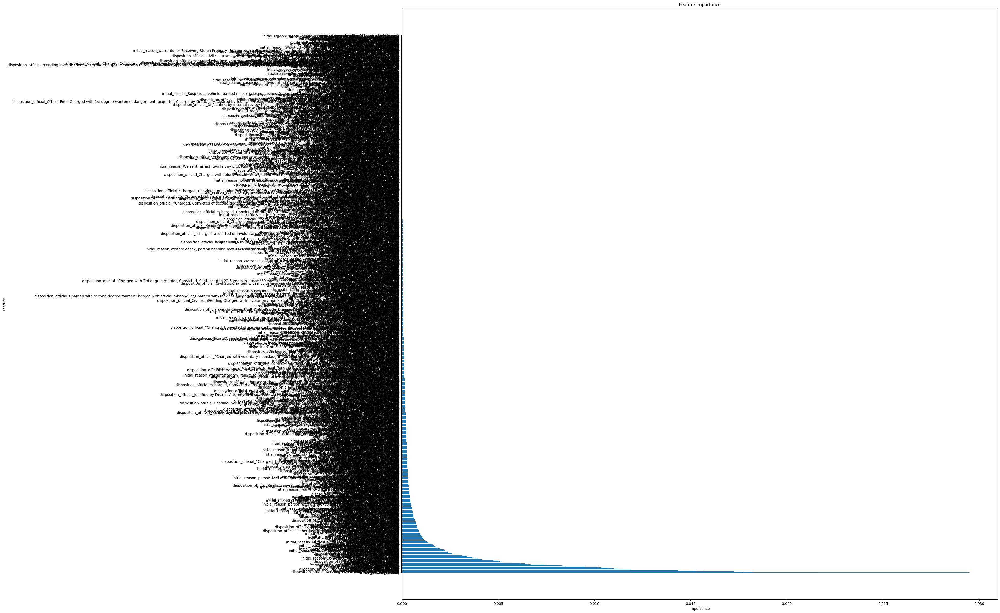

In [46]:
feature_importances = clf.feature_importances_
feature_names = encoded_df.columns

feature_importance_df = pd.DataFrame({'Features': feature_names, 'Importance': feature_importances})


feature_importance_df = feature_importance_df.sort_values(by = 'Importance', ascending=False)

plt.figure(figsize=(30,30))
plt.barh(feature_importance_df['Features'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.yticks()
plt.show()